In [75]:
# HR Analytics Project
# Samrat Dey
# Batch - DS2312

In [76]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [77]:
df=pd.read_csv('https://raw.githubusercontent.com/Dey-Samrat/Evaluation-Projects/main/WA_Fn-UseC_-HR-Employee-Attrition.csv')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


The dataset contains the information of employees of the company where both numerical and categorical data present. Here 'Attrition' is the target variable which contains 2 categories, so it will be temed as 'Classification Problem' where we need to analyze the attrition of a particular employee of the company.

In [78]:
df.shape

(1470, 35)

The dataset contains 1470 rows and 35 columns. Out of which 1 column is the taraget variable and the remaining 34 columns are independent variables

In [79]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [80]:
df.columns.tolist()

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [81]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

There are two different types of data (object and int64) present in the dataset

In [82]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [84]:
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64


No     1233
Yes     237
Name: Attrition, dtype: int64


Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23     2

<Axes: >

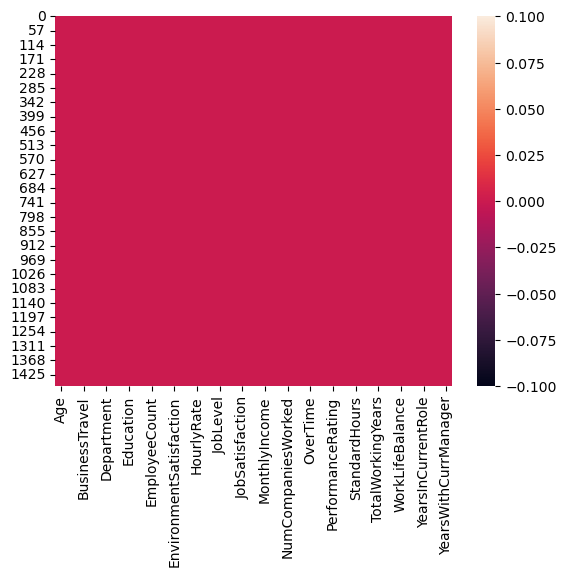

In [85]:
sns.heatmap(df.isnull())

In [86]:
# Checking nmber of unique values in each column
df.nunique().to_frame("No. of Unique values")

,No. of Unique values
Age,43
Attrition,2
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EmployeeCount,1
EmployeeNumber,1470


In [87]:
# Droping EmployeeNumber column
df.drop('EmployeeNumber',axis=1,inplace=True)
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,3,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,4,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,1,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,3,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,4,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,4,...,4,80,0,17,3,2,9,6,0,8


In [88]:
# Seperating numerical and categorical columns
# Checking for categorical column
cat_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        cat_col.append(i)
print("Categorical Columns are:",cat_col)
print("\n")

# Checking for numerical column
num_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        num_col.append(i)
print("Numerical Columns are:",num_col)
print("\n")

Categorical Columns are: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']


Numerical Columns are: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']




In [89]:
# Statistical summary of numerical columns
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,2.721769,65.891156,2.729932,2.063946,2.728571,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,1.093082,20.329428,0.711561,1.106940,1.102846,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,30.000000,1.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,2.000000,48.000000,2.000000,1.000000,2.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,4.000000,83.750000,3.000000,3.000000,4.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


1. The counts of all the columns are same which means there are no missing values in the dataset
2. The mean value is greater than the median(50%) in some columns, which means the data is skewed to right in these columns
3. The mean value is lesser than the median(50%) in few other columns, which means the data is skewed to left in this column
4. By summerizing the data we can observe that there are difference between 75% and max in few columns, hence there are outliers present in the data

No     1233
Yes     237
Name: Attrition, dtype: int64


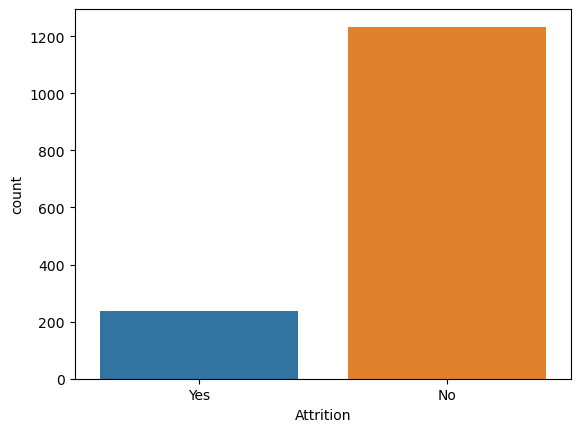

In [90]:
# Visualize the attrition among employees
ax=sns.countplot(x='Attrition',data=df)
print(df['Attrition'].value_counts())

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


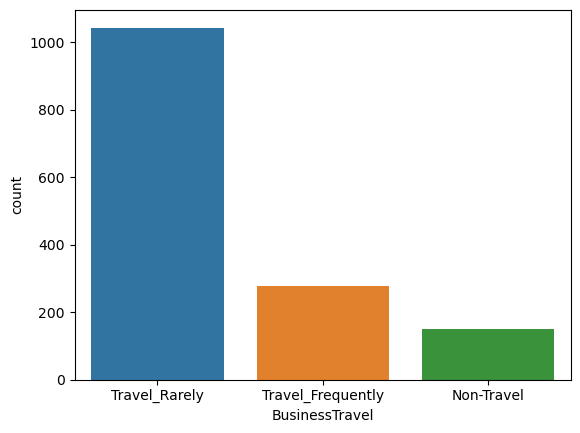

In [91]:
# Visualize the business travel records of employees
ax=sns.countplot(x='BusinessTravel',data=df)
print(df['BusinessTravel'].value_counts())

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


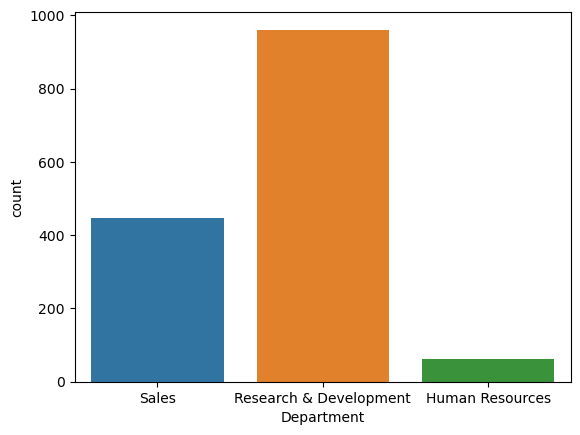

In [92]:
# Visualize the departments of employees
ax=sns.countplot(x='Department',data=df)
print(df['Department'].value_counts())

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


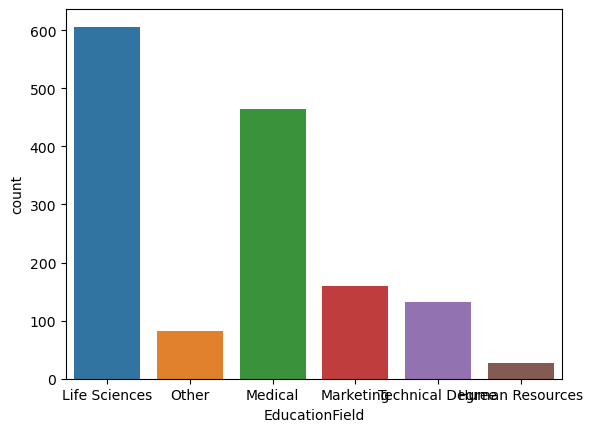

In [93]:
# Visualize the education field of employees
ax=sns.countplot(x='EducationField',data=df)
print(df['EducationField'].value_counts())

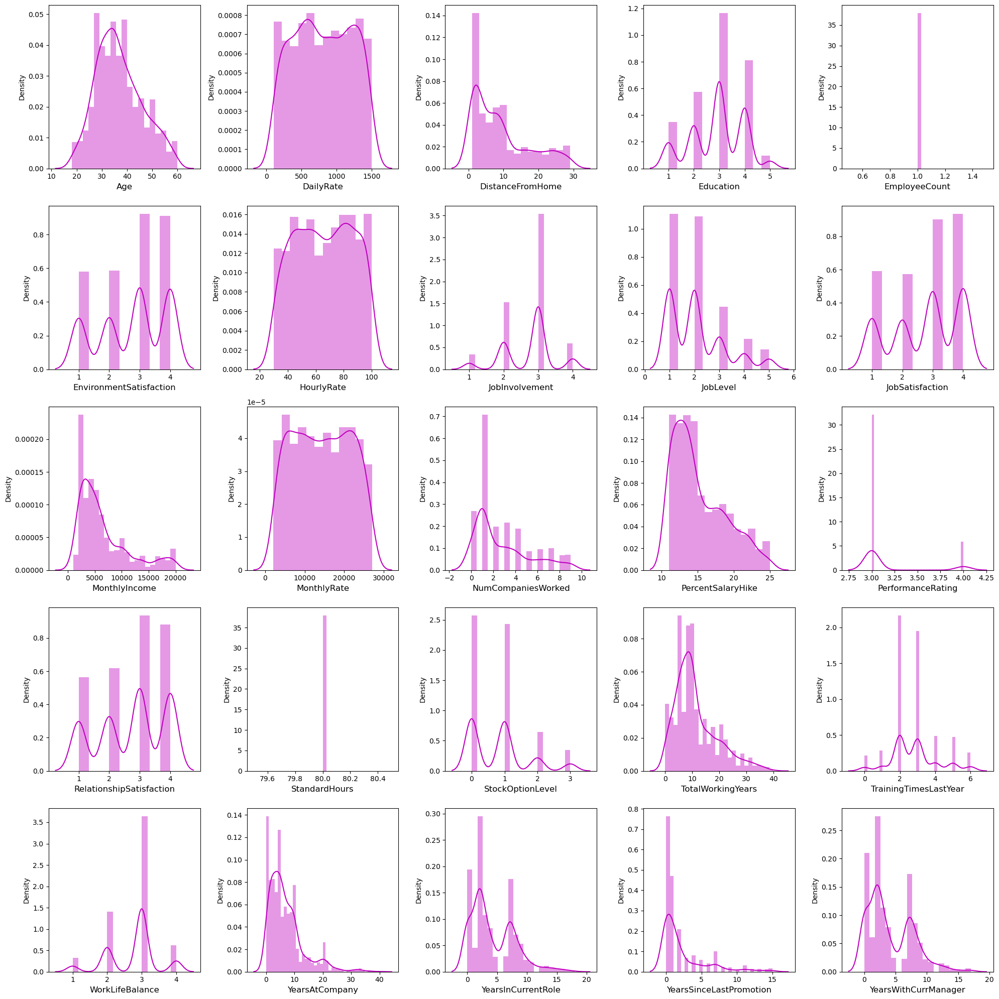

In [94]:
plt.figure(figsize=(20,20),facecolor="white")
plotnumber=1
for col in num_col:
    if plotnumber<=25:
        ax=plt.subplot(5,5,plotnumber)
        sns.distplot(df[col],color="m")
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0,fontsize=10)
    plotnumber+=1
plt.tight_layout()

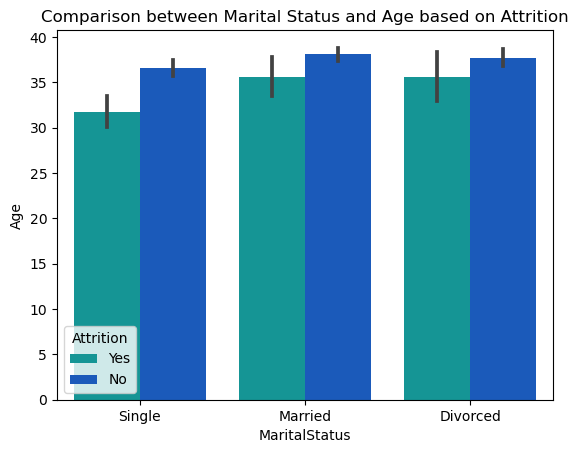

In [95]:
# Comparing Age and Marital Status on the basis of Attrition
plt.title("Comparison between Marital Status and Age based on Attrition")
sns.barplot(x="MaritalStatus",y="Age",data=df,palette="winter_r",hue="Attrition")
plt.show()

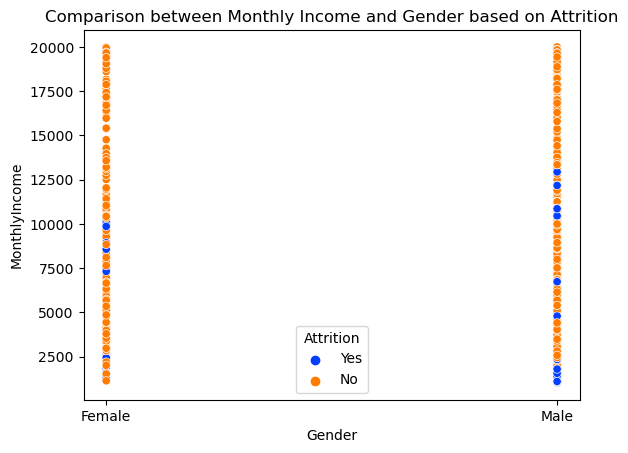

In [96]:
# Comparing Monthly Income and Gender on the basis of Attrition
plt.title("Comparison between Monthly Income and Gender based on Attrition")
sns.scatterplot(x="Gender",y="MonthlyIncome",data=df,palette="bright",hue="Attrition")
plt.show()

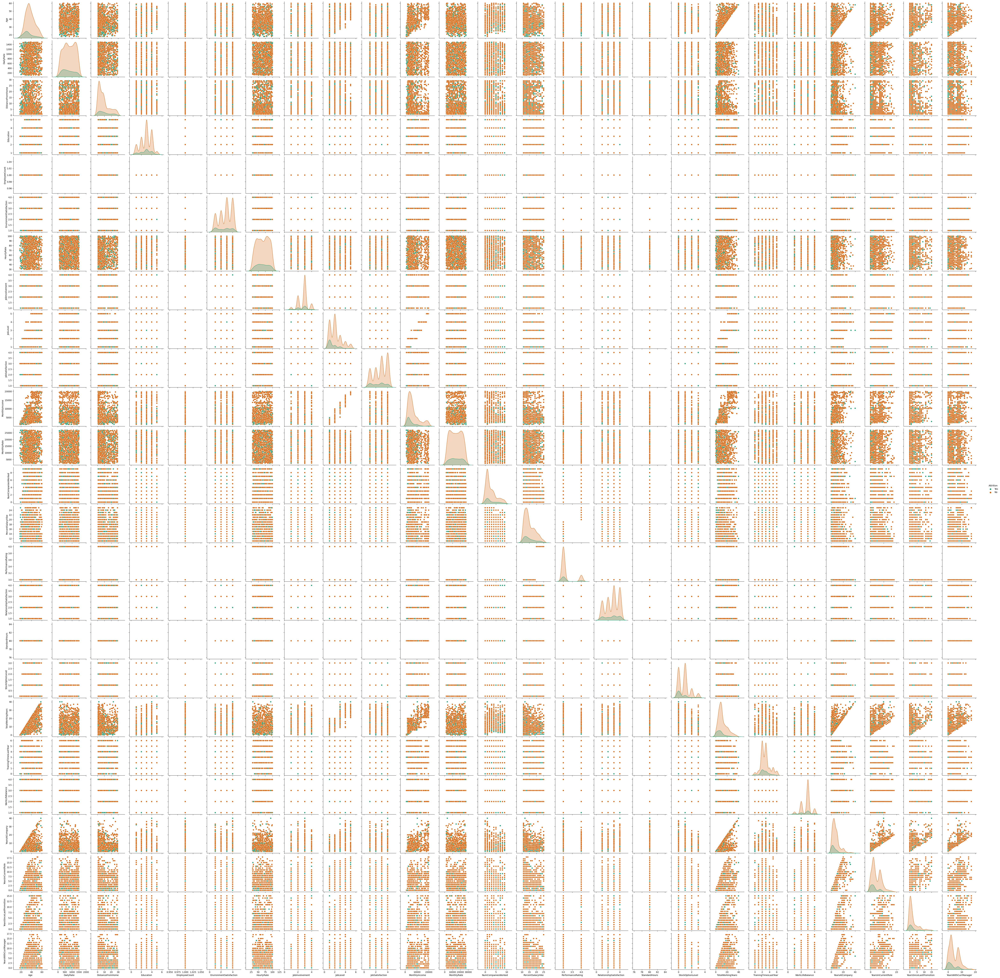

In [97]:
sns.pairplot(df,hue="Attrition",palette="Dark2")
plt.show()

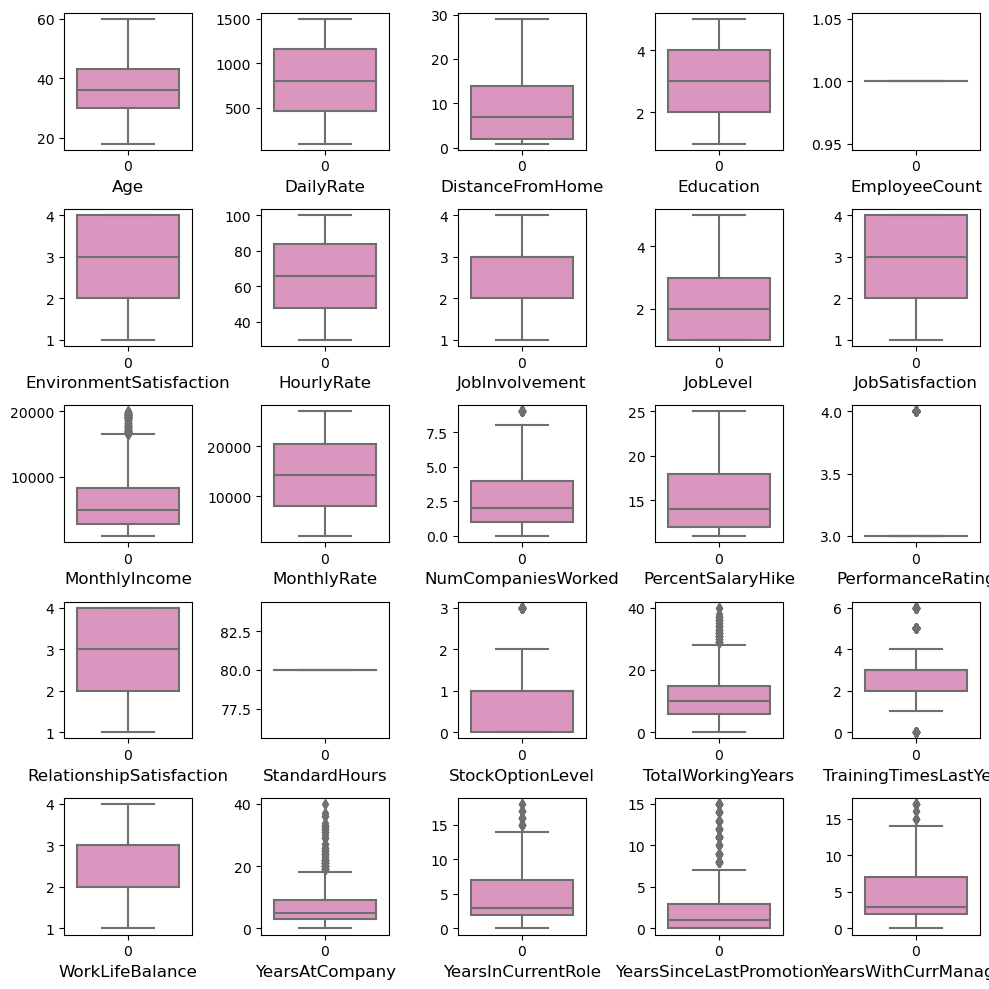

In [98]:
# Checking for outliers by plotting boxplpot
plt.figure(figsize=(10,10),facecolor="white")
plotnumber=1
for col in num_col:
    if plotnumber<=25:
        ax=plt.subplot(5,5,plotnumber)
        sns.boxplot(df[col],palette="Set2_r")
        plt.xlabel(col, fontsize=12)
        plt.yticks(rotation=0,fontsize=10)
    plotnumber+=1
plt.tight_layout()

In [99]:
df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobSatisfaction            -0.329672
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
dtype: float64

The columns JobLevel, MonthlyIncome, NumCompaniesWorked, PerformanceRating, TotalWorkingYears, YearsAtCompany, YearsSinceLastPromotion have skewness in the data and we apply cuberoot method to remove skewness

In [100]:
df["JobLevel"]=np.cbrt(df["JobLevel"])
df["MonthlyIncome"]=np.cbrt(df["MonthlyIncome"])
df["NumCompaniesWorked"]=np.cbrt(df["NumCompaniesWorked"])
df["PerformanceRating"]=np.cbrt(df["PerformanceRating"])
df["TotalWorkingYears"]=np.cbrt(df["TotalWorkingYears"])
df["YearsAtCompany"]=np.cbrt(df["YearsAtCompany"])
df["YearsSinceLastPromotion"]=np.cbrt(df["YearsSinceLastPromotion"])

In [101]:
df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    0.460775
JobSatisfaction            -0.329672
MonthlyIncome               0.677032
MonthlyRate                 0.018578
NumCompaniesWorked         -0.699002
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
TotalWorkingYears          -0.395296
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany             -0.367351
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     0.198634
YearsWithCurrManager        0.833451
dtype: float64

The columns PerformanceRating still have skewness in the data, so we apply cuberoot method one more time to remove skewness

In [102]:
df["PerformanceRating"]=np.cbrt(df["PerformanceRating"])

In [103]:
df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    0.460775
JobSatisfaction            -0.329672
MonthlyIncome               0.677032
MonthlyRate                 0.018578
NumCompaniesWorked         -0.699002
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
TotalWorkingYears          -0.395296
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany             -0.367351
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     0.198634
YearsWithCurrManager        0.833451
dtype: float64

In [104]:
# Encoding categorical columns using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=="object":
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.0,2.0,1102,2.0,1,2,1.0,1,2,...,1,80,0,2.000000,0,1,1.817121,4,0.000000,5
1,49,0.0,1.0,279,1.0,8,1,1.0,1,3,...,4,80,1,2.154435,3,3,2.154435,7,1.000000,7
2,37,1.0,2.0,1373,1.0,2,2,4.0,1,4,...,2,80,0,1.912931,3,3,0.000000,0,0.000000,0
3,33,0.0,1.0,1392,1.0,3,4,1.0,1,4,...,3,80,0,2.000000,3,3,2.000000,7,1.442250,0
4,27,0.0,2.0,591,1.0,2,1,3.0,1,1,...,4,80,1,1.817121,3,3,1.259921,2,1.259921,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0.0,1.0,884,1.0,23,2,3.0,1,3,...,3,80,1,2.571282,3,3,1.709976,2,0.000000,3
1466,39,0.0,2.0,613,1.0,6,1,3.0,1,4,...,1,80,1,2.080084,5,3,1.912931,7,1.000000,7
1467,27,0.0,2.0,155,1.0,4,3,1.0,1,2,...,2,80,1,1.817121,0,3,1.817121,2,0.000000,3
1468,49,0.0,1.0,1023,2.0,2,3,3.0,1,4,...,4,80,0,2.571282,3,2,2.080084,6,0.000000,8


In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   float64
 2   BusinessTravel            1470 non-null   float64
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   float64
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   float64
 8   EmployeeCount             1470 non-null   int64  
 9   EnvironmentSatisfaction   1470 non-null   int64  
 10  Gender                    1470 non-null   float64
 11  HourlyRate                1470 non-null   int64  
 12  JobInvolvement            1470 non-null   int64  
 13  JobLevel                  1470 non-null   float64
 14  JobRole 

In [106]:
# Statistical summary of numerical columns
df.describe()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,1.607483,802.485714,1.260544,9.192517,2.912925,2.247619,1.0,2.721769,...,2.712245,80.0,0.793878,2.112394,2.799320,2.761224,1.742334,4.229252,0.848611,4.123129
std,9.135373,0.367863,0.665455,403.509100,0.527792,8.106864,1.024165,1.331369,0.0,1.093082,...,1.081209,0.0,0.852077,0.550542,1.289271,0.706476,0.585822,3.623137,0.764768,3.568136
min,18.000000,0.000000,0.000000,102.000000,0.000000,1.000000,1.000000,0.000000,1.0,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,465.000000,1.000000,2.000000,2.000000,1.000000,1.0,2.000000,...,2.000000,80.0,0.000000,1.817121,2.000000,2.000000,1.442250,2.000000,0.000000,2.000000
50%,36.000000,0.000000,2.000000,802.000000,1.000000,7.000000,3.000000,2.000000,1.0,3.000000,...,3.000000,80.0,1.000000,2.154435,3.000000,3.000000,1.709976,3.000000,1.000000,3.000000
75%,43.000000,0.000000,2.000000,1157.000000,2.000000,14.000000,4.000000,3.000000,1.0,4.000000,...,4.000000,80.0,1.000000,2.466212,3.000000,3.000000,2.080084,7.000000,1.442250,7.000000
max,60.000000,1.000000,2.000000,1499.000000,2.000000,29.000000,5.000000,5.000000,1.0,4.000000,...,4.000000,80.0,3.000000,3.419952,6.000000,4.000000,3.419952,18.000000,2.466212,17.000000


In [109]:
# Checking the correlation between features and target
cor=df.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,NaN,0.010146,...,0.053535,NaN,0.037510,0.670212,-0.019621,-0.021490,0.277599,0.212901,0.178217,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,NaN,-0.103369,...,-0.045872,NaN,-0.137145,-0.220336,-0.059478,-0.063939,-0.190852,-0.160545,-0.055223,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,NaN,0.004174,...,-0.035986,NaN,-0.016727,0.045264,0.015240,-0.011256,-0.002484,-0.011497,-0.030144,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,NaN,0.018355,...,0.007846,NaN,0.042143,0.023035,0.002453,-0.037848,-0.011387,0.009932,-0.038943,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,NaN,-0.019395,...,-0.022414,NaN,-0.012193,-0.008491,0.036875,0.026383,0.011446,0.056315,0.018416,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,NaN,-0.016075,...,0.006557,NaN,0.044872,0.016360,-0.036942,-0.026556,0.017250,0.018845,0.011809,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,NaN,-0.027128,...,-0.009118,NaN,0.018422,0.170609,-0.025100,0.009819,0.061038,0.060236,0.030448,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,NaN,0.043163,...,-0.004378,NaN,-0.016185,-0.016817,0.049195,0.041191,-0.006638,-0.010506,0.010138,-0.004130
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,NaN,1.000000,...,0.007665,NaN,0.003432,-0.019455,-0.019359,0.027627,0.004573,0.018007,0.031155,-0.004999


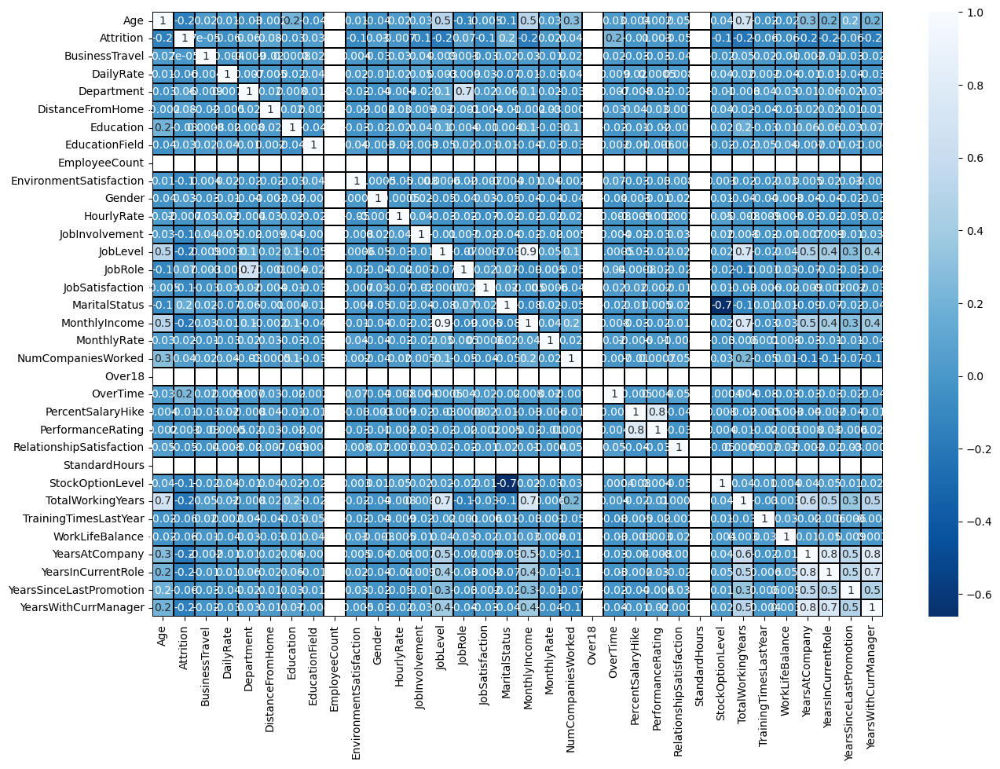

In [110]:
# Visualizing the correlation matrix by plotting the heatmap
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),linewidths=0.1,fmt=".1g",linecolor="black",annot=True,cmap="Blues_r")
plt.yticks(rotation=0);
plt.show()

In [111]:
cor['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
OverTime                    0.246118
MaritalStatus               0.162070
DistanceFromHome            0.077924
JobRole                     0.067151
Department                  0.063991
NumCompaniesWorked          0.044984
Gender                      0.029453
EducationField              0.026846
MonthlyRate                 0.015170
PerformanceRating           0.002889
BusinessTravel              0.000074
HourlyRate                 -0.006846
PercentSalaryHike          -0.013478
Education                  -0.031373
RelationshipSatisfaction   -0.045872
YearsSinceLastPromotion    -0.055223
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
StockOptionLevel           -0.137145
YearsWithCurrManager       -0.156199
Age                        -0.159205
YearsInCurrentRole         -0.160545
M

We observe positive and negative correlated features with the target

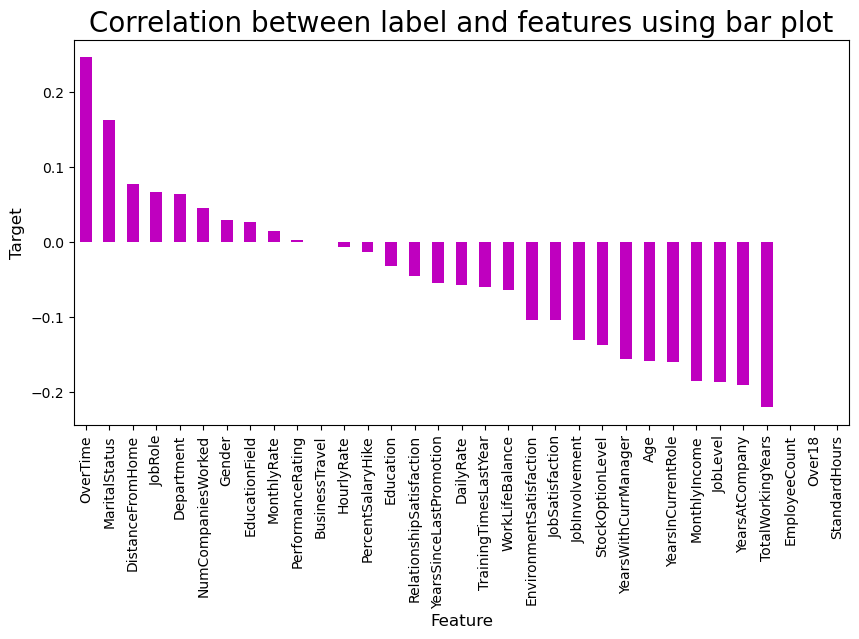

In [112]:
# Visualizing the correlation between label and features using bar plot
plt.figure(figsize=(10,5))
df.corr()['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar',color='m')
plt.xlabel('Feature', fontsize=12)
plt.ylabel('Target', fontsize=12)
plt.title("Correlation between label and features using bar plot", fontsize=20)
plt.show()

In [113]:
# Separating features and label
x=df.drop("Attrition",axis=1)
y=df["Attrition"]

In [114]:
# Feature scaling using standard scalarization
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,Gender,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.590048,0.742527,1.401512,-1.010909,-0.891688,-0.937414,0.0,-0.660531,-1.224745,...,-1.584178,0.0,-0.932014,-0.204222,-2.171982,-2.493820,0.127705,-0.063296,-1.110010,0.245834
1,1.322365,-0.913194,-1.297775,-0.493817,-0.147150,-1.868426,-0.937414,0.0,0.254625,0.816497,...,1.191438,0.0,0.241988,0.076388,0.155707,0.338096,0.703698,0.764998,0.198021,0.806541
2,0.008343,0.590048,1.414363,-0.493817,-0.887515,-0.891688,1.316673,0.0,1.169781,0.816497,...,-0.658973,0.0,-0.932014,-0.362426,0.155707,0.338096,-2.975183,-1.167687,-1.110010,-1.155935
3,-0.429664,-0.913194,1.461466,-0.493817,-0.764121,1.061787,-0.937414,0.0,1.169781,-1.224745,...,0.266233,0.0,-0.932014,-0.204222,0.155707,0.338096,0.439987,0.764998,0.776497,-1.155935
4,-1.086676,0.590048,-0.524295,-0.493817,-0.887515,-1.868426,0.565311,0.0,-1.575686,0.816497,...,1.191438,0.0,0.241988,-0.536515,0.155707,0.338096,-0.823761,-0.615492,0.538006,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,-0.913194,0.202082,-0.493817,1.703764,-0.891688,0.565311,0.0,0.254625,0.816497,...,0.266233,0.0,0.241988,0.833802,0.155707,0.338096,-0.055254,-0.615492,-1.110010,-0.314873
1466,0.227347,0.590048,-0.469754,-0.493817,-0.393938,-1.868426,0.565311,0.0,1.169781,0.816497,...,-1.584178,0.0,0.241988,-0.058709,1.707500,0.338096,0.291310,0.764998,0.198021,0.806541
1467,-1.086676,0.590048,-1.605183,-0.493817,-0.640727,0.085049,-0.937414,0.0,-0.660531,0.816497,...,-0.658973,0.0,0.241988,-0.536515,-2.171982,0.338096,0.127705,-0.615492,-1.110010,-0.314873
1468,1.322365,-0.913194,0.546677,1.401512,-0.887515,0.085049,0.565311,0.0,1.169781,0.816497,...,1.191438,0.0,-0.932014,0.833802,0.155707,-1.077862,0.576737,0.488900,-1.110010,1.086895


In [115]:
# Checking Variance Inflation Factor in each scaled column
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,2.010222,Age
1,1.019772,BusinessTravel
2,1.023141,DailyRate
3,1.967463,Department
4,1.015386,DistanceFromHome
5,1.064391,Education
6,1.017841,EducationField
7,NaN,EmployeeCount
8,1.021140,EnvironmentSatisfaction
9,1.020232,Gender


In [116]:
y.value_counts()

0.0    1233
1.0     237
Name: Attrition, dtype: int64

Here the data is not balanced. Since it is a classification problem, we will balance the data using over sampling method

In [117]:
!pip install imblearn
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x1,y1=SM.fit_resample(x,y)

In [118]:
y.value_counts()

0.0    1233
1.0     237
Name: Attrition, dtype: int64

In [119]:
y1.value_counts()

1.0    1233
0.0    1233
Name: Attrition, dtype: int64

In [120]:
# Finding the best random state
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxaccu=0
maxrs=0
for i in range (1,400):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.25,random_state=1)
    RFR=RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxrs=i
print("Best Accuracy is",maxaccu,"at random_state",maxrs)

Best Accuracy is 0.9238249594813615 at random_state 16


The best accuracy is 92.38% at random_state 16

In [121]:
# Classification Algorithms
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [122]:
# Checking accuracy for Random Forest Classifier
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.899513776337115
[[287  10]
 [ 52 268]]
              precision    recall  f1-score   support

         0.0       0.85      0.97      0.90       297
         1.0       0.96      0.84      0.90       320

    accuracy                           0.90       617
   macro avg       0.91      0.90      0.90       617
weighted avg       0.91      0.90      0.90       617



The accuracy for this model is 89.95%

In [126]:
# Checking accuracy for Logistic Regression
LR=LogisticRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.7682333873581848
[[225  72]
 [ 71 249]]
              precision    recall  f1-score   support

         0.0       0.76      0.76      0.76       297
         1.0       0.78      0.78      0.78       320

    accuracy                           0.77       617
   macro avg       0.77      0.77      0.77       617
weighted avg       0.77      0.77      0.77       617



The accuracy score using Logistic Regression is 76.82%

In [125]:
# Checking accuracy for Gradient Boosting Classifier
GB=LogisticRegression()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.7682333873581848
[[225  72]
 [ 71 249]]
              precision    recall  f1-score   support

         0.0       0.76      0.76      0.76       297
         1.0       0.78      0.78      0.78       320

    accuracy                           0.77       617
   macro avg       0.77      0.77      0.77       617
weighted avg       0.77      0.77      0.77       617



The accuracy for this model is 76.82%

In [127]:
# Checking accuracy for Support Vector Machine Classifier
SVC=SVC()
SVC.fit(x_train,y_train)
predSVC=SVC.predict(x_test)
print(accuracy_score(y_test,predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC))

0.8865478119935171
[[262  35]
 [ 35 285]]
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88       297
         1.0       0.89      0.89      0.89       320

    accuracy                           0.89       617
   macro avg       0.89      0.89      0.89       617
weighted avg       0.89      0.89      0.89       617



The accuracy for this model is 88.65%

In [128]:
# Checking accuracy for AdaBoost Classifier
ABC=AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC=ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.8881685575364667
[[276  21]
 [ 48 272]]
              precision    recall  f1-score   support

         0.0       0.85      0.93      0.89       297
         1.0       0.93      0.85      0.89       320

    accuracy                           0.89       617
   macro avg       0.89      0.89      0.89       617
weighted avg       0.89      0.89      0.89       617



The accuracy for this model is 88.81%

In [129]:
# Checking accuracy for Bagging Classifier
BC=BaggingClassifier()
BC.fit(x_train,y_train)
predBC=BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8768233387358185
[[283  14]
 [ 62 258]]
              precision    recall  f1-score   support

         0.0       0.82      0.95      0.88       297
         1.0       0.95      0.81      0.87       320

    accuracy                           0.88       617
   macro avg       0.88      0.88      0.88       617
weighted avg       0.89      0.88      0.88       617



The accuracy for this model is 87.68%

In [130]:
# Checking accuracy for ExtraTrees Classifier
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
predETC=ETC.predict(x_test)
print(accuracy_score(y_test,predETC))
print(confusion_matrix(y_test,predETC))
print(classification_report(y_test,predETC))

0.9497568881685575
[[289   8]
 [ 23 297]]
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95       297
         1.0       0.97      0.93      0.95       320

    accuracy                           0.95       617
   macro avg       0.95      0.95      0.95       617
weighted avg       0.95      0.95      0.95       617



The accuracy for this model is 94.98%

In [131]:
from sklearn.model_selection import cross_val_score

In [132]:
# Checking cv score for a Random Forest Classifier
score=cross_val_score(RFC,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predRFC)-score.mean())

[0.78340081 0.96551724 0.96551724 0.97363083 0.97565923]
0.9327450706654293
Differrence between accuracy score and cross validation score is -0.03323129432831429


In [133]:
# Checking cv score for a Logistic Regression
score=cross_val_score(LR,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predLR)-score.mean())

[0.79959514 0.78093306 0.78904665 0.79918864 0.79310345]
0.7923733893948477
Differrence between accuracy score and cross validation score is -0.02414000203666289


In [134]:
# Checking cv score for a Gradient Boosting Classifier
score=cross_val_score(GB,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predGB)-score.mean())

[0.79959514 0.78093306 0.78904665 0.79918864 0.79310345]
0.7923733893948477
Differrence between accuracy score and cross validation score is -0.02414000203666289


In [135]:
# Checking cv score for a SVM Classifier
score=cross_val_score(SVC,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predSVC)-score.mean())

[0.88866397 0.9188641  0.92900609 0.91075051 0.92900609]
0.9152581484918413
Differrence between accuracy score and cross validation score is -0.028710336498324218


In [136]:
# Checking cv score for a AdaBoost Classifier
score=cross_val_score(ABC,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predABC)-score.mean())

[0.58906883 0.93306288 0.92494929 0.90669371 0.93509128]
0.8577731972308678
Differrence between accuracy score and cross validation score is 0.030395360305598973


In [152]:
# Checking cv score for a Bagging Classifier
score=cross_val_score(BC,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predBC)-score.mean())

[0.77272727 0.84090909 0.82727273 0.91324201 0.85844749]
0.8425197177251972
Differrence between accuracy score and cross validation score is 0.012025736820257316


In [137]:
# Checking cv score for a ExtrTrees Classifier
score=cross_val_score(ETC,x1,y1)
print(score)
print(score.mean())
print("Differrence between accuracy score and cross validation score is", accuracy_score(y_test,predETC)-score.mean())

[0.93724696 0.97971602 0.97768763 0.97768763 0.98377282]
0.9712222121851672
Differrence between accuracy score and cross validation score is -0.02146532401660972


Random Forest Classifier is our best model as the difference between accuracy score and cross validation score is least

# Hyper Parameter Tuning

In [141]:
from sklearn.model_selection import GridSearchCV
parameters={'criterion':['gini','entropy'], 'random_state':[10,50,1000],'max_depth':[0,10,20],'n_jobs':[-2,-1,1],'n_estimators':[50,100,200,300]}

In [142]:
GCV=GridSearchCV(RandomForestClassifier(),parameters,cv=5)

In [144]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [145]:
GCV.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 100,
 'n_jobs': -2,
 'random_state': 1000}

In [148]:
Final_model=RandomForestClassifier(criterion='entropy',max_depth=20,n_estimators=100,n_jobs=-2,random_state=50)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

91.57212317666126


In [149]:
Final_model=RandomForestClassifier(criterion='gini',max_depth=20,n_estimators=100,n_jobs=-2,random_state=1000)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

90.27552674230147


# Plotting ROC and AUC for all the models used

In [151]:
from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve

disp=plot_roc_curve(RFC,x_test,y_test,ax=disp.ax_)
disp=plot_roc_curve(LR,x_test,y_test,ax=disp.ax_)
disp=plot_roc_curve(GB,x_test,y_test,ax=disp.ax_)
disp=plot_roc_curve(SVC,x_test,y_test,ax=disp.ax_)
disp=plot_roc_curve(ABC,x_test,y_test,ax=disp.ax_)
disp=plot_roc_curve(BC,x_test,y_test,ax=disp.ax_)
disp=plot_roc_curve(ETC,x_test,y_test,ax=disp.ax_)
plt.legend(prop={'size':11},loc='lower right')
plt.show()

ImportError: cannot import name 'plot_roc_curve' from 'sklearn.metrics' (C:\Users\Samrat Dey\anaconda3\lib\site-packages\sklearn\metrics\__init__.py)

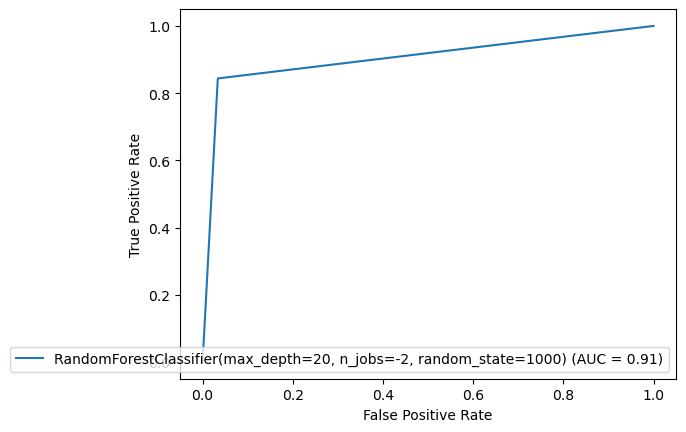

In [154]:
from sklearn import metrics
fpr,tpr,thresholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=Final_model)
display.plot()

Here we have plotted the ROC curve for the Final model and AUC value for the best model is 91%

In [155]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_model,"HR_Analytics.pkl")

['HR_Analytics.pkl']

In [156]:
# Predicting the saved model
model=joblib.load("HR_Analytics.pkl")
prediction=model.predict(x_test)
prediction

array([0., 1., 0., 1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0., 1., 1., 0., 0., 1.,
       0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1.,
       0., 0., 1., 0., 0., 1., 1., 1., 0., 1., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 1., 1., 1., 0., 1., 0., 0.,
       1., 1., 0., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 1., 1., 0.,
       1., 1., 0., 1., 1., 1., 1., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 0.,
       1., 1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1., 1.,
       0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0.,
       0., 1., 1., 1., 1., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 1.,
       0., 0., 0., 1., 1.

In [157]:
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df

,Predicted,Original
0,0.0,0.0
1,1.0,1.0
2,0.0,0.0
3,1.0,1.0
4,1.0,1.0
...,...,...
612,1.0,1.0
613,0.0,1.0
614,0.0,0.0
615,0.0,0.0
